# 3D stack of grids

In [1]:
%%capture
%load_ext autoreload
%autoreload 2

# set Python's logging level to get information
import logging

import pyogrio

from polartoolkit import fetch, maps, regions

logging.getLogger().setLevel(logging.INFO)

load some grids (from the bottom up)

In [2]:
region = regions.ross_ice_shelf

basement = fetch.basement(region=region)
bed = fetch.bedmap2(layer="bed", region=region)
icebase = fetch.bedmap2(layer="icebase", region=region)
surface = fetch.bedmap2(layer="surface", region=region)

grids = [basement, bed, icebase, surface]

INFO:root:returning grid with new region and/or registration, same spacing
INFO:root:returning grid with new region and/or registration, same spacing
INFO:root:calculating icebase from surface and thickness grids
INFO:root:returning grid with new region and/or registration, same spacing
INFO:root:returning grid with new region and/or registration, same spacing


make the initial plot

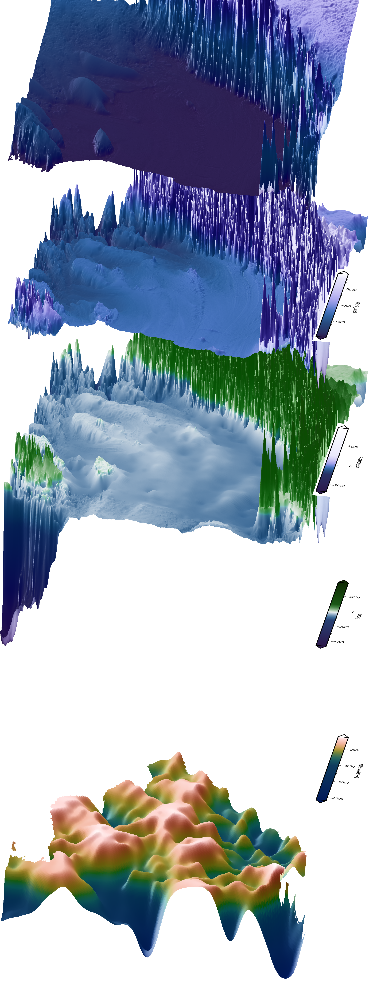

In [3]:
fig = maps.plot_3d(
    grids=grids,
    cmaps=["batlowW", "cork", "devon", "devon"],
    exaggeration=[7, 20, 20, 20],
    cbar_labels=["basement", "bed", "icebase", "surface"],
)
fig.show()

## Add a shapefile to mask the grids, and fine tune the layout

Make a smoothed outline of the Ross Ice Shelf

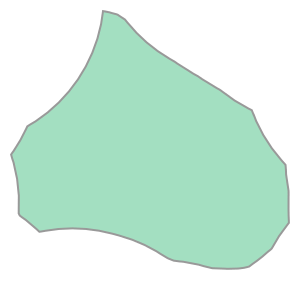

In [4]:
# fetch MEaSURES iceshelf shapefiles
measures_shelves = fetch.measures_boundaries(version="IceShelf")

# read into a geodataframe
ice_shelves = pyogrio.read_dataframe(measures_shelves)

# extract Ross Ice Shelf east and west polygons
RIS_separate = ice_shelves[ice_shelves.NAME.isin(["Ross_West", "Ross_East"])]

# merge into 1 polygon
RIS = RIS_separate.dissolve()

smooth_RIS = RIS.buffer(500e3, join_style=1).buffer(-520e3, join_style=1)
smooth_RIS.geometry[0]

makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)
makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)
makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)
makecpt [WARNING]: Without inc in -T option, -Z has no effect (ignored)


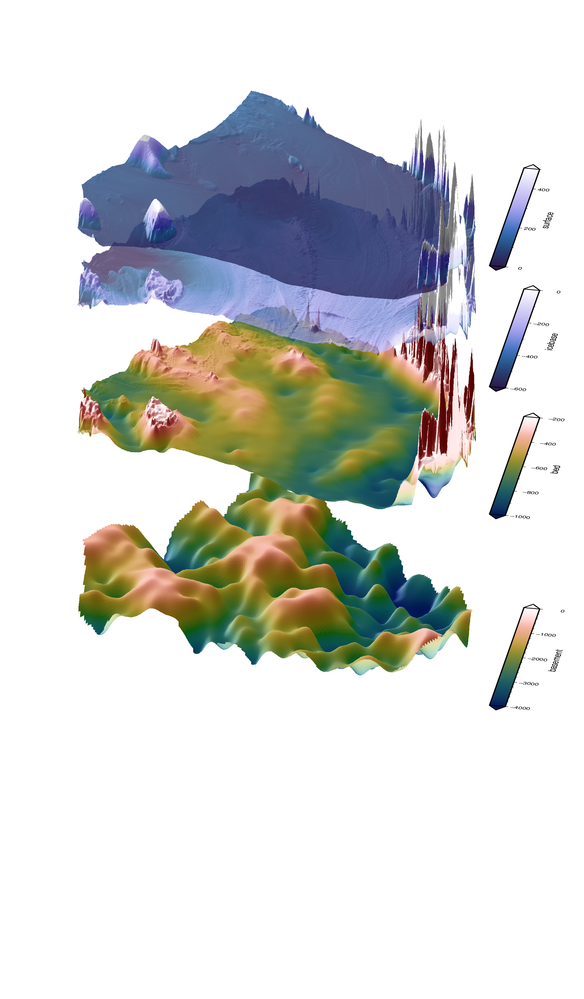

In [9]:
fig = maps.plot_3d(
    grids=grids,
    cmaps=["batlowW", "batlowW", "devon", "devon"],
    exaggeration=[7, 20, 20, 20],
    cbar_labels=["basement", "bed", "icebase", "surface"],
    shp_mask=smooth_RIS,
    region=region,
    cbar_yshift=[2, 13, 13, 15.5],
    zshifts=[-5, 4, 1.3, 0.5],
    transparencies=[0, 0, 30, 20],
    cpt_lims=[(-4e3, 0), (-1000, -200), (-600, 0), (0, 500)],
    grd2cpt=False,
    hemisphere="south",
)
fig.show()

See the map tutorial walkthrough for examples of interactively creating a custom shapefile to use for the masking